## __Plato Notebook 5b: Effects of sediment subduction on global plate motion__

Thomas Schouten, Whitney Behr, Edward Clennett and Thorsten Becker

This jupyter notebook provides a walkthrough of the Plato algorithm applied to calculate theoretical velocity increases resulting from sediment lubrication.

#### __0. Prepare Python__

First, we load the required packages.

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))

from plato.optimisation import Optimisation
from plato.plate_torques import PlateTorques
from plato.plot import PlotReconstruction

#### __1. Set up the PlateTorques object__

The below cell loads a `PlateTorques` object for the Müller et al. (2016) reconstruction by providing the ages of interest and the relevant reconstruction files from the sample data folder.

In [2]:
# Set parameters
COMPUTE_TORQUES = True  # Whether or not to compute torques
PLOT_FIGS = True        # Whether or not to plot the results

# Plate reconstruction
reconstruction_name = "Muller2016" 

# Reconstruction ages of interest
ages = [100, 180]

# Load excel file with settings
settings_file = os.path.join(os.getcwd(), "settings.xlsx")

# Set directory with sample data
data_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "sample_data", "M2016"))

# Set directory to save the results
results_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "..", "output_notebooks", "05b-Effects_of_sediment_subduction"))

# Set directory to save the figures
figs_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "..", "figures_notebooks", "05b-Effects_of_sediment_subduction"))

# Load seafloor age and continental grids
seafloor_age_grids = {}; continental_grids = {}
for age in ages:
    seafloor_age_grids[age] = xr.open_dataset(os.path.join(data_dir, "seafloor_age_grids", f"M2016_SeafloorAgeGrid_{age}Ma.nc"))
    continental_grids[age] = xr.open_dataset(os.path.join(data_dir, "continental_grids", f"M2016_ContinentalGrid_{age}Ma.nc"))

# Plotting parameters
cm2in = 0.3937008
fig_width = 18*cm2in*2; fig_height_graphs = 8*cm2in*2; fig_height_maps = 10.5*cm2in*2
plt.rcParams["font.size"] = 12
plt.rcParams["font.family"] = "Arial"
title_fontsize = 20
plot_times = [45, 60, 75, 90]
projection = ccrs.Robinson(central_longitude = 160) 
annotations = ["a", "b", "c", "d"]

In [3]:
# Set up PlateTorques objects
M2016 = PlateTorques(
    reconstruction_name = "Muller2016",
    ages = ages,
    cases_file = settings_file,
    cases_sheet = "5b - Sediment subduction",
    files_dir = results_dir,
    rotation_file = os.path.join(data_dir, "gplates_files", "M2016_rotations_Lr-Hb.rot"),
    topology_file = os.path.join(data_dir, "gplates_files", "M2016_topologies.gpml"),
    polygon_file = os.path.join(data_dir, "gplates_files",  "M2016_static_polygons.gpml"),
    seafloor_age_grids = seafloor_age_grids,
    continental_grids = continental_grids,
)

Calculating RMS velocities: 100%|██████████| 2/2 [00:00<00:00, 17848.10it/s]


#### __1.2 Adding sediment distributions__

Then we generate and add several sediment distributions to the PlateForces object. These are:

- Terrigenous sediments from passive margins (from [Dutkiewicz et al., 2016](https://doi.org/10.1002/2017GC007258])).
- Biogenic sediments from carbonate sediments.
- Biogenic sediments from the equatorial bulge.

Parameterisations for the biogenic sediments can be found in notebook 05a-Effects_of_sediment_subduction.

In [4]:
def equatorial_sediments(seafloor_ages, latitudes, thickness):
    """
    Generates a sediment distribution as a Gaussian centred around the equator.
    
    :param seafloor_ages:   age grid of the seafloor
    :type seafloor_ages:    np.array or xr.DataArray
    :param latitudes:       latitudes of grid
    :type latitudes:        array-like
    :param thickness:       thickness of sediments at the equator on 1 Ma old lithosphere
    :type thickness:        float or int

    :return:                grid with thickness of fluctuating sediments
    :rtype:                 np.array or xr.DataArray
    """
    # Expand latitude array to match size of seafloor_ages grid
    latitudes_expanded = np.meshgrid(np.arange(seafloor_ages.shape[1]), latitudes)[1]
    
    # Calculate sediment thickness as a function of latitude and plate age
    grid = np.sqrt(seafloor_ages.values) * thickness * np.exp(-(latitudes_expanded**2) / (2e2))

    # Convert grid to xarray DataArray
    grid = xr.DataArray(grid, coords=seafloor_ages.coords, dims=seafloor_ages.dims)

    return grid

def fluctuating_sediments(seafloor_ages, phase, thicknesses, periods):
    """
    Generates a sediment distribution that fluctuates with lithospheric age.

    :param seafloor_ages:   age grid of the seafloor
    :type seafloor_ages:    np.array or xr.DataArray
    :param phase:           phase shift of the sine wave describing the fluctuations in sedimentation
    :type phase:            float or int
    :param thicknesses:     amplitude of the sine wave describing the fluctuations in sedimentation
    :param periods:         period of the sine wave describing the fluctuations in sedimentation

    :return:                grid with thickness of fluctuating sediments
    :rtype:                 np.array or xr.DataArray
    """
    # Calculate the thickness of fluctuating sediments
    grid = np.zeros_like(seafloor_ages.values)

    # Loop over thicknesses and periods
    for thickness, period in zip(thicknesses, periods):
        value = thickness * np.sin(seafloor_ages.values * 2 * np.pi / period + phase * period)
    
    grid = np.where(
        np.isnan(seafloor_ages.values),
        np.nan,
        np.where(
            value <= 0,
            1e-6,
            value
        )
    )

    # Convert grid to xarray DataArray
    grid = xr.DataArray(grid, coords=seafloor_ages.coords, dims=seafloor_ages.dims)

    return grid

def globsed_thickness(seafloor_ages, latitude):
    """
    Analytical function to calculate the thickness of sediments on the seafloor as a function of age and latitude from the GlobSed dataset (Straume et al., 2019).

    :param age:         age of the seafloor in Ma
    :type age:          float or int or np.array
    :param latitude:    latitude of the seafloor in degrees
    :type latitude:     float or int or np.array

    :return:            thickness of sediments on the seafloor
    :rtype:             float or int or np.array
    """
    # Expand the latitudes array to match the shape of the seafloor_ages grid
    latitudes_expanded = np.abs(np.repeat(latitude.values, seafloor_ages.values.shape[1]).reshape(seafloor_ages.values.shape[0], seafloor_ages.values.shape[1]))

    # Calculate the thickness of sediments on the seafloor
    grid = np.sqrt(seafloor_ages.values) * (52 - 2.46 * latitudes_expanded + 0.045 * latitudes_expanded**2)

    # Convert grid to xarray DataArray
    grid = xr.DataArray(grid, coords=seafloor_ages.coords, dims=seafloor_ages.dims)

    return grid

In [5]:
# Load passive margin sediment grids from Dutkiewicz et al. (2016) for the valid reconstruction times
dutkiewicz = {}
for age in ages:
    dutkiewicz[age] = xr.open_dataset(os.path.join(data_dir, "passive_margin_sediment_grids", f"sed_thick_0.2d_{age}.nc"))

In [6]:
M2016.add_grid(dutkiewicz, "passive_margin_sediment", "sediment")

In [7]:
# Generate equatorial sediment grid and assign to scenarios
for age in ages:
    M2016.grids.sediment[age]["equatorial_sediments"] = equatorial_sediments(M2016.grids.seafloor_age[age].seafloor_age, M2016.grids.seafloor_age[age].latitude, 75)

In [8]:
# Generate carbonate sediment grid with phase shift
carbonate_sediment_thicknesses = [30, 300]
carbonate_sediment_periods = [5, 50]
carbonate_sediment_variables = ["carbonate_sediments", "carbonate_sediments_offset1", "carbonate_sediments_offset2"]
carbonate_sediment_phases = [0, 100, 200, 0]

for age in ages:
    for variable, phase in zip(carbonate_sediment_variables, carbonate_sediment_phases):
        M2016.grids.sediment[age][variable] = fluctuating_sediments(
            M2016.grids.seafloor_age[age].seafloor_age, 
            phase, 
            carbonate_sediment_thicknesses, 
            carbonate_sediment_periods
        )

        # Set negative values to zero and continents to NaN
        M2016.grids.sediment[age][variable] = M2016.grids.sediment[age][variable].where(
            M2016.grids.sediment[age][variable] > 0, 
            0
        ).where(
            M2016.grids.seafloor_age[age]["seafloor_age"].notnull(), 
            np.nan
        )

    M2016.grids.sediment[age]["carbonate_sediments_period"] = fluctuating_sediments(
            M2016.grids.seafloor_age[age].seafloor_age, 
            0, 
            carbonate_sediment_thicknesses, 
            [10, 100],
        )

    # Set negative values to zero and continents to NaN
    M2016.grids.sediment[age]["carbonate_sediments_period"] = M2016.grids.sediment[age]["carbonate_sediments_period"].where(
        M2016.grids.sediment[age]["carbonate_sediments_period"] > 0, 
        0
    ).where(
        M2016.grids.seafloor_age[age]["seafloor_age"].notnull(), 
        np.nan
    )


In [9]:
# Generate GlobSed sediment grid
for age in ages:
    M2016.grids.sediment[age]["globsed_sediment"] = globsed_thickness(M2016.grids.seafloor_age[age].seafloor_age, M2016.grids.seafloor_age[age].latitude)

In [10]:
# Inspect the seafloor grid to check if all sediment distributions have been added correctly
M2016.grids.sediment[100]

<xarray.Dataset> Size: 234MB
Dimensions:                      (latitude: 1801, longitude: 3601)
Coordinates:
  * longitude                    (longitude) float64 29kB -180.0 ... 180.0
  * latitude                     (latitude) float64 14kB -90.0 -89.9 ... 90.0
Data variables:
    passive_margin_sediment      (latitude, longitude) float32 26MB nan ... nan
    equatorial_sediments         (latitude, longitude) float64 52MB nan ... nan
    carbonate_sediments          (latitude, longitude) float32 26MB nan ... nan
    carbonate_sediments_offset1  (latitude, longitude) float32 26MB nan ... nan
    carbonate_sediments_offset2  (latitude, longitude) float32 26MB nan ... nan
    carbonate_sediments_period   (latitude, longitude) float32 26MB nan ... nan
    globsed_sediment             (latitude, longitude) float64 52MB nan ... nan
Attributes:
    Conventions:  COARDS, CF-1.5
    title:        
    history:      nearneighbor E:/Users/John/Downloads/GPlates/data/PythonWor...
    description:  
    GMT_version:  5.4.0 (r18194) [64-bit]

The below cells sample the synthetic sediment grids for both end-member 

In [11]:
# Sample slab_data
if COMPUTE_TORQUES:
    M2016.sample_all()

Adding values: 100%|██████████| 21/21 [00:00<00:00, 197.74it/s]


In [12]:
def set_sediment_thickness(
        slabs,
        selected_trench_plateID,
        selected_trench_sediment_thickness,
        other_trench_sediment_thickness = None,
        longitudinal_gradient = 0,
        latitudinal_gradient = 0
    ):
    """
    Set the sediment thickness for a specific trench plate ID in a given scenario and case.
    NOTE: Option "Active margin sediments" must initially be set to a nonzero value.

    :param slabs:                               slab data
    :type slabs:                                pd.DataFrame
    :param selected_trench_plateID:             selected trench plate ID
    :type selected_trench_plateID:              int or list
    :param selected_trench_sediment_thickness:  sediment thickness for selected trench plate ID
    :type selected_trench_sediment_thickness:   float or int
    :param other_trench_sediment_thickness:     sediment thickness for other trench plate IDs
    :type other_trench_sediment_thickness:      float or int
    :param longitudinal_gradient:               longitudinal gradient of sediment thickness
    :type longitudinal_gradient:                float or int
    :param latitudinal_gradient:                latitudinal gradient of sediment thickness
    :type latitudinal_gradient:                 float or int

    :return:                                    slab data with updated sediment thickness
    :rtype:                                     pd.DataFrame
    """
    # Select slabs based on trench_plateID
    if isinstance(selected_trench_plateID, list):
        selected_indices = slabs["trench_plateID"].isin(selected_trench_plateID)
    else:
        selected_indices = slabs["trench_plateID"] == selected_trench_plateID

    # Compute new sediment thickness for selected slabs
    new_thickness = (
        selected_trench_sediment_thickness +
        longitudinal_gradient * (slabs.loc[selected_indices, "lon"] - slabs.loc[selected_indices, "lon"].max()) +
        latitudinal_gradient * (slabs.loc[selected_indices, "lat"] - slabs.loc[selected_indices, "lat"].max())
    )

    # Apply computed thickness, ensuring no negative values
    slabs.loc[selected_indices, "sediment_thickness"] = np.where(new_thickness < 0, 0, new_thickness)

    # Set sediment thickness for other trench plate IDs if specified
    if other_trench_sediment_thickness is not None:
        slabs.loc[~selected_indices, "sediment_thickness"] = other_trench_sediment_thickness

    return slabs


In [13]:
if COMPUTE_TORQUES:
    # Set sediment thickness along Indian trench
    M2016.slabs.data[100]["am_sed_x"] = set_sediment_thickness(M2016.slabs.data[100]["am_sed_x"], 67350, 2e3, 0)
    M2016.slabs.data[100]["am_sed_y"] = set_sediment_thickness(M2016.slabs.data[100]["am_sed_y"], 67350, 2e3, 0, 80)
    M2016.slabs.data[100]["am_sed_z"] = set_sediment_thickness(M2016.slabs.data[100]["am_sed_z"], [518, 67350], 2e3, 0, 35)

    # Set sediment thickness along Eurasian trenches
    M2016.slabs.data[180]["am_sed_x"] = set_sediment_thickness(M2016.slabs.data[180]["am_sed_x"], 301, 2e3, 0)
    M2016.slabs.data[180]["am_sed_y"] = set_sediment_thickness(M2016.slabs.data[180]["am_sed_y"], 301, 2e3, 0, 80)
    M2016.slabs.data[180]["am_sed_z"] = set_sediment_thickness(M2016.slabs.data[180]["am_sed_z"], [301, 518, 67350], 2e3, 0, 20)

In [14]:
if COMPUTE_TORQUES:
    for age in M2016.settings.ages:
        M2016.slabs.data[age]["am_sed_a"].sediment_thickness = np.where(
            M2016.slabs.data[age]["am_sed_a"].continental_arc == True,
            M2016.slabs.data[age]["am_sed_a"].slab_seafloor_age ** 1.5 * 2.5,
            0
        )

We can calculate some statistics of the reconstruction snapshots, e.g. total subduction zone length and fraction that is island arc.

In [15]:
for age in M2016.settings.ages:
    total_subduction_length = M2016.slabs.data[age]["am_sed"].trench_segment_length.sum()
    continental_upper_plate_fraction = M2016.slabs.data[age]["am_sed"].loc[M2016.slabs.data[age]["am_sed"].continental_arc==True].trench_segment_length.sum() / total_subduction_length
    print(f"Total subduction length at {age} Ma: {total_subduction_length/1e3} km")
    print(f"Fraction of the subduction length at {age} Ma that has a continental overriding plate: {continental_upper_plate_fraction*100}%")

Total subduction length at 100 Ma: 68628.66922751044 km
Fraction of the subduction length at 100 Ma that has a continental overriding plate: 67.09785615489193%
Total subduction length at 180 Ma: 63543.849993768636 km
Fraction of the subduction length at 180 Ma that has a continental overriding plate: 81.78125263648631%


In [16]:
for i, age in enumerate(M2016.settings.ages):
    print(f"Net lithospheric rotation at {age} Ma: {M2016.globe.data['no_sed'].net_rotation_rate.values[i]} deg/Ma around a pole located at {M2016.globe.data['no_sed'].net_rotation_pole_lat.values[i]} deg latitude and {M2016.globe.data['no_sed'].net_rotation_pole_lon.values[i]} deg longitude")

Net lithospheric rotation at 100 Ma: 0.01152969142705845 deg/Ma around a pole located at 24.38810626513059 deg latitude and -89.7080104233853 deg longitude
Net lithospheric rotation at 180 Ma: 0.015419934156621573 deg/Ma around a pole located at 77.1190757247296 deg latitude and -167.36347662701988 deg longitude


## __1.3 Torque computation__

Now we compute the torques using the `compute_torques()` and save them with the `save_all()` functions of the `PlateForces` object.

In [17]:
# Compute torques
if COMPUTE_TORQUES:
    M2016.calculate_all_torques()

Calculating residual forces at points: 100%|██████████| 22/22 [00:00<00:00, 26.07it/s]


In [18]:
# Reset sediment thickness for am_sed_v case
if COMPUTE_TORQUES:
    for age in M2016.settings.ages:
        M2016.slabs.data[age]["am_sed_v"].sediment_thickness = np.where(
            M2016.slabs.data[age]["am_sed_v"].continental_arc == True,
            -1.5e2 * M2016.slabs.data[age]["no_sed"].lower_plate_velocity_mag + 2.5e3,
            0
        )
        M2016.slabs.data[age]["am_sed_av"].sediment_thickness = np.where(
            M2016.slabs.data[age]["am_sed_av"].continental_arc == True,
            0.5 * M2016.slabs.data[age]["am_sed_v"].sediment_thickness + 0.5 * M2016.slabs.data[age]["am_sed_a"].sediment_thickness,
            0
        )

    M2016.calculate_all_torques(cases=["am_sed_v", "am_sed_av"])

Calculating residual forces at points: 100%|██████████| 2/2 [00:00<00:00, 59074.70it/s]


In [19]:
if COMPUTE_TORQUES:
    M2016.calculate_synthetic_velocity()
    M2016.calculate_net_rotation()

Calculating net rotation: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]


In [20]:
optimise_scenarios = Optimisation(M2016)

In [21]:
# Save torques to output directory
if COMPUTE_TORQUES:
    M2016.save_all()

Saving Globe: 100%|██████████| 22/22 [00:00<00:00, 471.21it/s]


#### __2. Analysis__

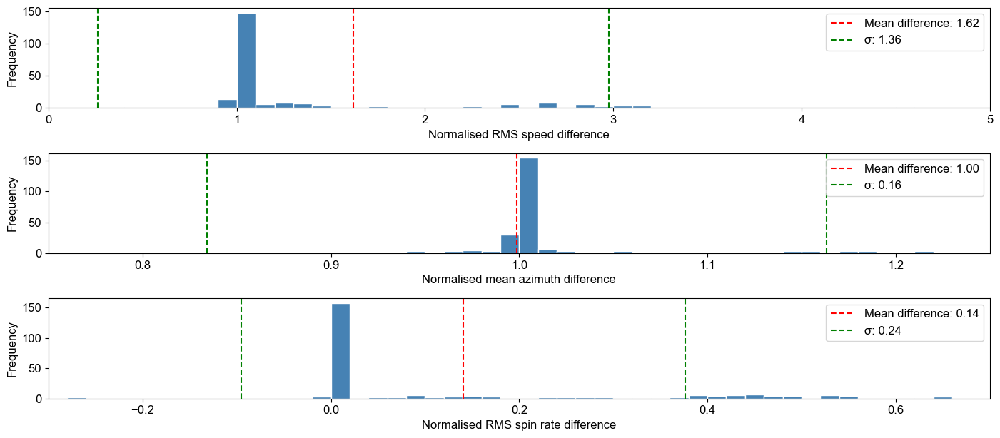

In [22]:
if PLOT_FIGS:
    all_v_rms_mag_diffs = np.array([])
    all_v_rms_azi_diffs = np.array([])
    all_omega_rms_diffs = np.array([])

    for age in M2016.settings.ages:
        # Filter reference plates by minimum area
        ref_plates = M2016.plates.data[age]["no_sed"][M2016.plates.data[age]["no_sed"].area >= M2016.settings.options["no_sed"]["Minimum plate area"]]

        for case in M2016.settings.cases:
            if case == "no_sed" or case == "ref" or "cb_sed" in case:
                continue
                
            # Filter plates by minimum area
            plates = M2016.plates.data[age][case][M2016.plates.data[age][case].area >= M2016.settings.options[case]["Minimum plate area"]]

            # Calculate the difference in RMS velocity components at the centroid of the plate
            v_rms_mag_diff = plates.velocity_rms_mag / ref_plates.velocity_rms_mag
            v_rms_azi_diff = plates.velocity_mean_azi / ref_plates.velocity_mean_azi
            omega_rms_diff = np.log10(np.abs(plates.spin_rate_rms_mag / ref_plates.spin_rate_rms_mag))

            # # Remove NaN or infinite values
            v_rms_mag_diff = v_rms_mag_diff[np.isfinite(v_rms_mag_diff)]
            v_rms_azi_diff = v_rms_azi_diff[np.isfinite(v_rms_azi_diff)]
            omega_rms_diff = omega_rms_diff[np.isfinite(omega_rms_diff)]

            # # Calculate absolute spin rate
            # omega_rms_diff = np.abs(omega_rms_diff)

            # Append differences to arrays
            all_v_rms_mag_diffs = np.append(all_v_rms_mag_diffs, v_rms_mag_diff)
            all_v_rms_azi_diffs = np.append(all_v_rms_azi_diffs, v_rms_azi_diff)
            all_omega_rms_diffs = np.append(all_omega_rms_diffs, omega_rms_diff)

    # Calculate the mean differences
    mean_v_rms_mag_diff = np.mean(all_v_rms_mag_diffs)
    mean_v_rms_azi_diff = np.mean(all_v_rms_azi_diffs)
    mean_omega_rms_diff = np.mean(all_omega_rms_diffs)

    # Calculate the standard deviation of the azimuth difference
    std_v_rms_mag_diff = np.std(all_v_rms_mag_diffs)
    std_v_rms_azi_diff = np.std(all_v_rms_azi_diffs)
    std_omega_rms_diff = np.std(all_omega_rms_diffs)

    # Take the log 10 values of the omega RMS differences
    all_omega_rms_diffs = all_omega_rms_diffs
    mean_omega_rms_diff = mean_omega_rms_diff
    std_omega_rms_diff = std_omega_rms_diff

    # Plot histogram of azimuth differences
    fig, axes = plt.subplots(3, 1, figsize=(fig_width, fig_height_graphs))
    bin_ranges = [(0, 5), (0.75, 1.25), (-.3, .7)]
    for ax, all, mean, std, bin_range in zip(axes, [all_v_rms_mag_diffs, all_v_rms_azi_diffs, all_omega_rms_diffs], [mean_v_rms_mag_diff, mean_v_rms_azi_diff, mean_omega_rms_diff], [std_v_rms_mag_diff, std_v_rms_azi_diff, std_omega_rms_diff], bin_ranges):
        ax.hist(all, color="steelblue", edgecolor="white", bins=50, range=bin_range)
        ax.axvline(mean, color="red", linestyle="--", label=f"Mean difference: {mean:.2f}")
        ax.axvline(mean - std, color="green", linestyle="--", label=f"σ: {std:.2f}")
        ax.axvline(mean + std, color="green", linestyle="--")
        ax.legend()
        ax.set_ylabel("Frequency")
        ax.set_xlim(bin_range)

    axes[0].set_xlabel("Normalised RMS speed difference")
    axes[1].set_xlabel("Normalised mean azimuth difference")
    axes[2].set_xlabel("Normalised RMS spin rate difference")
    plt.tight_layout()

In [23]:
def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the Haversine distance between two sets of points on Earth.

    :param lat1:    Latitude of the first point in degrees.
    :type lat1:     float
    :param lon1:    Longitude of the first point in degrees.
    :type lon1:     float
    :param lat2:    Latitude of the second point in degrees.
    :type lat2:     float
    :param lon2:    Longitude of the second point in degrees.
    :type lon2:     float

    :return:        The Haversine distance between the two points in kilometres.
    :rtype:         float
    """
    # Convert latitude and longitude from degrees to radians
    lat1 = np.deg2rad(lat1)
    lon1 = np.deg2rad(lon1)
    lat2 = np.deg2rad(lat2)
    lon2 = np.deg2rad(lon2)

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return np.rad2deg(c)

In [24]:
plot_M2016 = PlotReconstruction(M2016, coastline_file = os.path.join(data_dir, "gplates_files", "M2016_coastlines.gpml"))

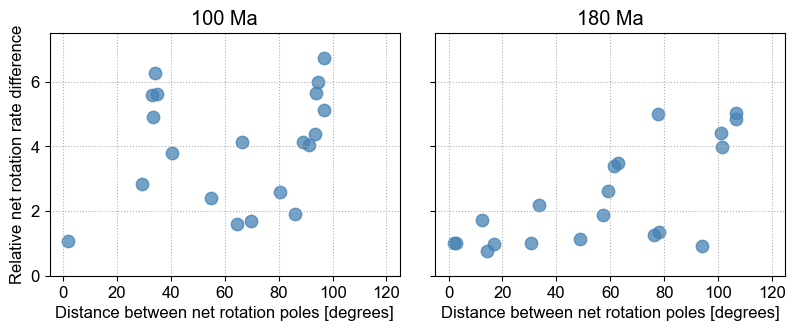

In [25]:
if PLOT_FIGS:
    distances = {}
    
    fig = plt.figure(figsize=(0.67*fig_width, fig_height_graphs*.5))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1], wspace=0.1)

    for case in M2016.settings.cases:
        if case == "no_sed":
            continue

        # Calculate the distance between the net rotation poles
        distances[case] = haversine(
            M2016.globe.data[case].net_rotation_pole_lat.values,
            M2016.globe.data[case].net_rotation_pole_lon.values,
            M2016.globe.data["no_sed"].net_rotation_pole_lat.values,
            M2016.globe.data["no_sed"].net_rotation_pole_lon.values,
        )

        for i in range(2):
            ax = plt.subplot(gs[i])

            if case == "ref":
                continue

            ax.scatter(
                distances[case][i],
                M2016.globe.data[case].net_rotation_rate.values[i]/M2016.globe.data["no_sed"].net_rotation_rate.values[i],
                c="black" if case == "ref" else "steelblue",
                alpha=0.75,
                s=80,
                marker="d" if case == "ref" else "o",
                label="Reconstructed NLR" if case == "ref" else None,
            )

            ax.set_xlim(-5, 125)
            ax.set_ylim(0, 7.5)

            ax.set_title(f"{M2016.settings.ages[i]} Ma")

            ax.set_xlabel("Distance between net rotation poles [degrees]")
            if i == 0:
                ax.set_ylabel("Relative net rotation rate difference")
            else:
                ax.set_yticklabels([])

            ax.grid(ls=":")
            # ax.legend(loc="upper left", framealpha=1) if i == 0 else None

    fig.savefig(os.path.join(figs_dir, "Net_rotation_option_1.png"), bbox_inches="tight", dpi=300)
    plt.show()

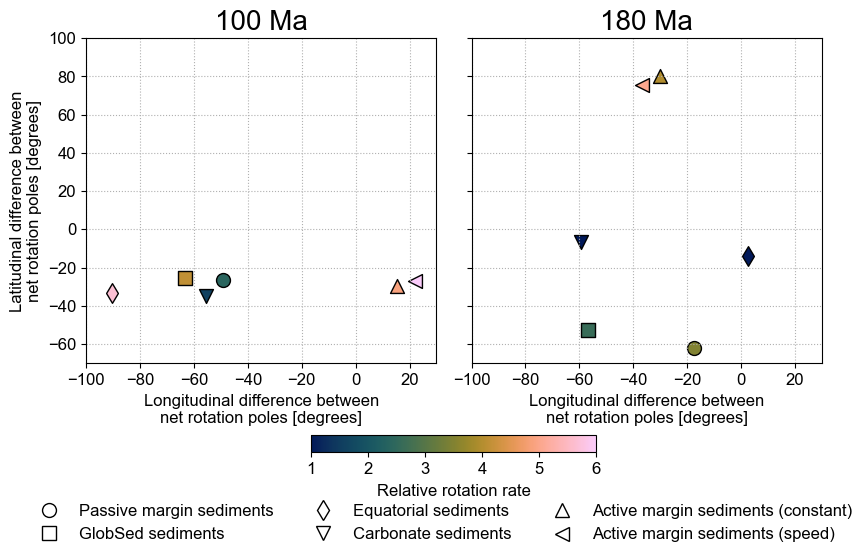

In [26]:
if PLOT_FIGS:
    # Set markers and labels for each case
    plot_cases = ["pm_sed", "gs_sed", "eq_sed", "cb_sed", "am_sed", "am_sed_a", "am_sed_v"]
    markers = ["o", "s", "d", "v", "^", "<", ">"]
    labels = ["Passive margin sediments", "GlobSed sediments", "Equatorial sediments", "Carbonate sediments", "Active margin sediments (constant)", "Active margin sediments (speed)"]

    fig = plt.figure(figsize=(0.67*fig_width, 0.67*fig_height_graphs))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1], wspace=0.1)

    for case, marker, label in zip(plot_cases, markers, labels):
        if case == "ref" or case == "no_sed":
            continue

        for i in range(2):
            ax = plt.subplot(gs[i])

            lon = M2016.globe.data[case].net_rotation_pole_lon.values[i] - M2016.globe.data["no_sed"].net_rotation_pole_lon.values[i]
            lat = M2016.globe.data[case].net_rotation_pole_lat.values[i] - M2016.globe.data["no_sed"].net_rotation_pole_lat.values[i]

            lon = np.where(lon > 180, lon - 360, lon)
            lon = np.where(lon < -180, lon + 360, lon)
            lat = np.where(lat > 90, lat - 180, lat)
            lat = np.where(lat < -90, lat + 180, lat)

            p = ax.scatter(
                lon,
                lat,            
                c = M2016.globe.data[case].net_rotation_rate.values[i]/M2016.globe.data["no_sed"].net_rotation_rate.values[i],
                cmap = "cmc.batlow",
                vmin = 1,
                vmax = 6,
                s = 100,
                marker=marker,
                label=label,
                edgecolors="black",
            )

            ax.set_ylim(-70, 100)
            ax.set_xlim(-100, 30)

            ax.set_title(f"{M2016.settings.ages[i]} Ma", fontsize=title_fontsize)

            ax.set_xlabel("Longitudinal difference between\nnet rotation poles [degrees]")
            if i == 0:
                ax.set_ylabel("Latitudinal difference between\nnet rotation poles [degrees]")
            else:
                ax.set_yticklabels([])

            ax.grid(ls=":")

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, -0.1, 0.3, 0.02*(10.5/8/.67)])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(p, cax=cax, orientation="horizontal", extendfrac=25e-3)

    # Set colorbar label
    cbar.set_label("Relative rotation rate", labelpad=5)

    # Get handles and labels for the legend
    handles = [Line2D([0], [0], marker=marker, color="w", markeredgecolor="k", label=label, markersize=10) for marker, label in zip(markers, labels)]

    # Add a legend below the entire figure
    fig.legend(handles, labels, loc="lower center", ncol=3, frameon=False, bbox_to_anchor=(0.5, -0.35))

    fig.savefig(os.path.join(figs_dir, "Net_rotation_option_2.png"), bbox_inches="tight", dpi=300)
    plt.show()


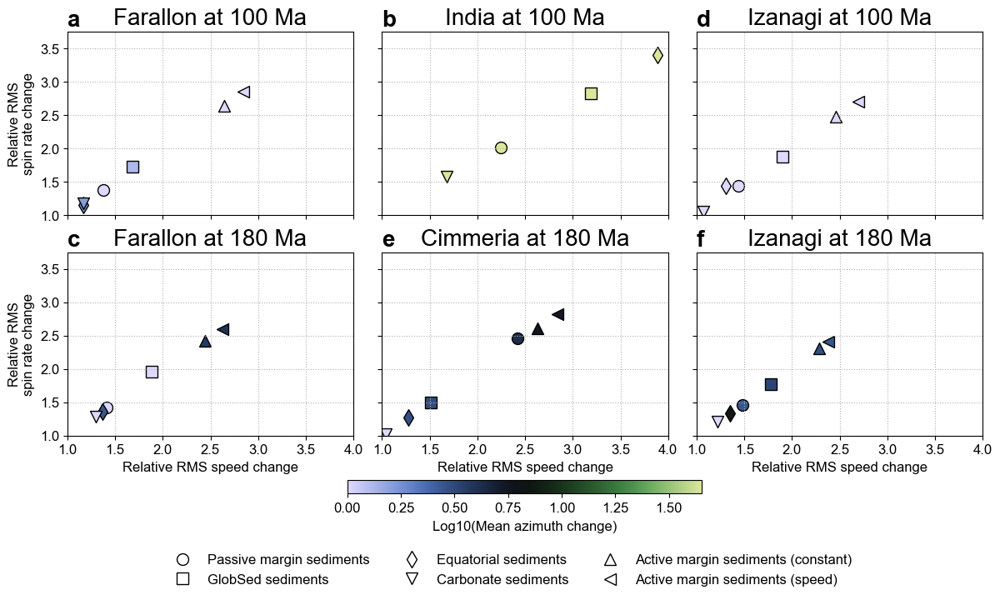

In [27]:
if PLOT_FIGS:
    # Set plateIDs of plates of interest for each time slice
    # 100 Ma
    plateIDs = {100: [902, 501, 926], 180: [902, 530, 926]}
    plate_names = {100: ["Farallon", "India", "Izanagi"], 180: ["Farallon", "Cimmeria", "Izanagi"]}

    # Set markers and labels for each case
    plot_cases = ["pm_sed", "gs_sed", "eq_sed", "cb_sed", "am_sed", "am_sed_a", "am_sed_v"]
    markers = ["o", "s", "d", "v", "^", "<", ">"]
    labels = ["Passive margin sediments", "GlobSed sediments", "Equatorial sediments", "Carbonate sediments", "Active margin sediments (constant)", "Active margin sediments (speed)"]

    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_graphs))
    gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1], wspace=0.1)

    axes = []
    k = 0
    for i, age in enumerate(M2016.settings.ages):
        for j in range(len(plateIDs[age])):
            # Select reference plate data
            ref_plate_data = M2016.plates.data[age]["no_sed"]
            ref_plate_data = ref_plate_data[ref_plate_data.plateID == plateIDs[age][j]]

            # Calculate reference metrics of interest
            ref_speed = ref_plate_data.velocity_rms_mag.values[0]
            ref_spin = ref_plate_data.spin_rate_rms_mag.values[0]
            ref_speed_over_spin = ref_plate_data.velocity_rms_mag.values[0] / ref_plate_data.spin_rate_rms_mag.values[0]
            ref_azimuth = ref_plate_data.velocity_mean_azi.values[0]

            ax = plt.subplot(gs[i,j])

            for case, marker, label in zip(plot_cases, markers, labels):
                if case == "no_sed" or case == "ref":
                    continue
                
                # Select plates
                case_plate_data = M2016.plates.data[age][case]
                case_plate_data = case_plate_data[case_plate_data.plateID == plateIDs[age][j]]

                # Calculate metrics of interest
                case_speed = case_plate_data.velocity_rms_mag.values[0]
                case_spin = case_plate_data.spin_rate_rms_mag.values[0]
                case_speed_over_spin = case_plate_data.velocity_rms_mag.values[0] / case_plate_data.spin_rate_rms_mag.values[0]
                case_azimuth = case_plate_data.velocity_mean_azi.values[0]

                p = ax.scatter(
                    case_speed/ref_speed,
                    np.abs(case_spin/ref_spin),
                    c=np.log10(np.abs(case_azimuth-ref_azimuth)),
                    vmin=0,
                    vmax=np.log10(45),
                    cmap="cmc.tofino",
                    marker=marker,
                    label=label,
                    edgecolors="black",
                    s=100
                )

            ax.set_xlim(1, 4)
            ax.set_ylim(1, 3.75)
            # ax.set_yscale("log")
            ax.grid(ls=":")
            ax.set_title(f"{plate_names[age][j]} at {age} Ma", fontsize=title_fontsize)
            ax.annotate("abdcef"[k], xy=(0, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)        

            if i != 1:
                ax.set_xticklabels([])
            else:
                ax.set_xlabel("Relative RMS speed change")

            if j == 0:
                ax.set_ylabel("Relative RMS\nspin rate change")
            else:
                ax.set_yticklabels([])

            k += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.0, 0.3, 0.02*(10.5/8)])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(p, cax=cax, orientation="horizontal", extendfrac=25e-3)

    # Set colorbar label
    cbar.set_label("Log10(Mean azimuth change)", labelpad=5)

    # Get handles and labels for the legend
    handles = [Line2D([0], [0], marker=marker, color="w", markeredgecolor="k", label=label, markersize=10) for marker, label in zip(markers, labels)]

    # Add a legend below the entire figure
    fig.legend(handles, labels, loc="lower center", ncol=3, frameon=False, bbox_to_anchor=(0.5, -0.2))

    fig.savefig(os.path.join(figs_dir, "Plate_velocity_changes.png"), bbox_inches="tight", dpi=300)

    plt.show()

### 3. Maps

Now we can plot the results. To this end we set the plotting options in the first cell to ensure a consistent style.

In the subsequent cells, we generate the figures from the paper.

#### __All results__

#### 1.4.1. Seafloor age distribution

The below cell visualises the seafloor age distribution for the two end-member plate configurations, like figure 1 of the paper.

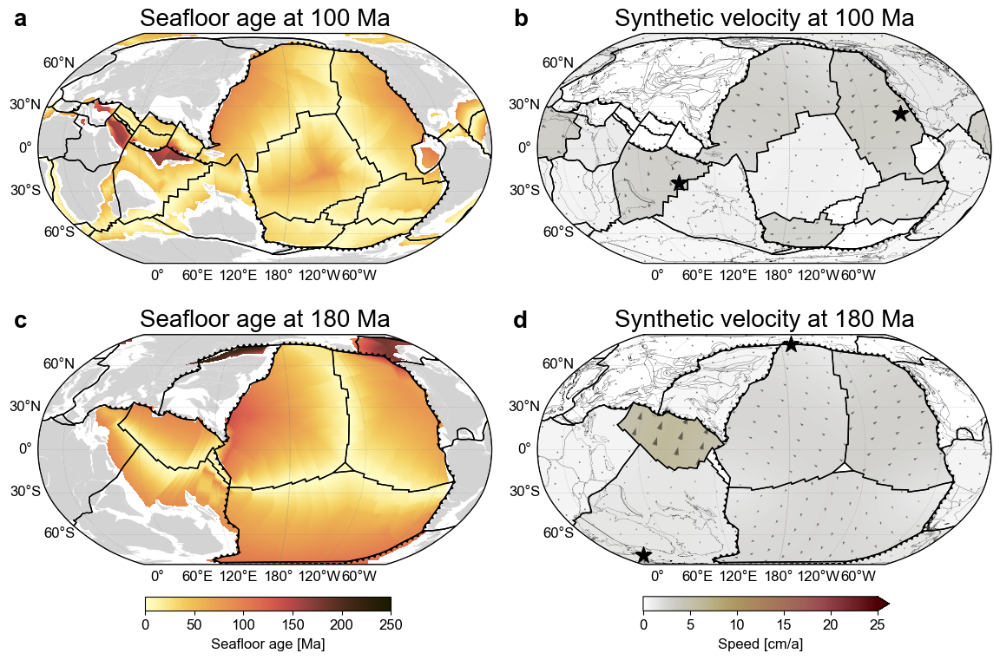

In [41]:
if PLOT_FIGS:
    fig = plt.figure(figsize=(fig_width, fig_height_maps))
    gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1)

    k = 0
    for i in range(0, 2):
        for j in range(0, 2):
            ax = plt.subplot(gs[i, j], projection=projection)
            age = 100 if i == 0 else 180
            if j == 0:
                seafloor_ages = plot_M2016.plot_seafloor_age_map(ax, age=age)
                ax.set_title(f"Seafloor age at {age} Ma", fontsize=title_fontsize)
            else:
                speeds, velocities = plot_M2016.plot_velocity_map(ax, age=age, case="no_sed", NET_ROTATION_POLE=True)
                ax.set_title(f"Synthetic velocity at {age} Ma", fontsize=title_fontsize)
            ax.annotate(annotations[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
            k += 1

    # Create new grids for the colourbars
    cax1 = fig.add_axes([0.212, 0.06, 0.2, 0.02])
    cax2 = fig.add_axes([0.617, 0.06, 0.2, 0.02])

    # Create a colorbar below the subplots
    cbar1 = plt.colorbar(seafloor_ages, cax=cax1, orientation="horizontal")
    cbar2 = plt.colorbar(speeds, cax=cax2, orientation="horizontal", extend="max")

    # Set colorbar label
    cbar1.set_label("Seafloor age [Ma]", labelpad=5)
    cbar2.set_label("Speed [cm/a]", labelpad=5)

    fig.savefig(os.path.join(figs_dir, "M2016_seafloor_ages_synthetics.png"), bbox_inches="tight", dpi=300)
    plt.show()

#### 1.4.2. Sediment distributions

The below cell visualises the reference seafloor sediment thickness for the four sediment distributions considered for the two end-member plate configurations, like figure 2 of the paper.

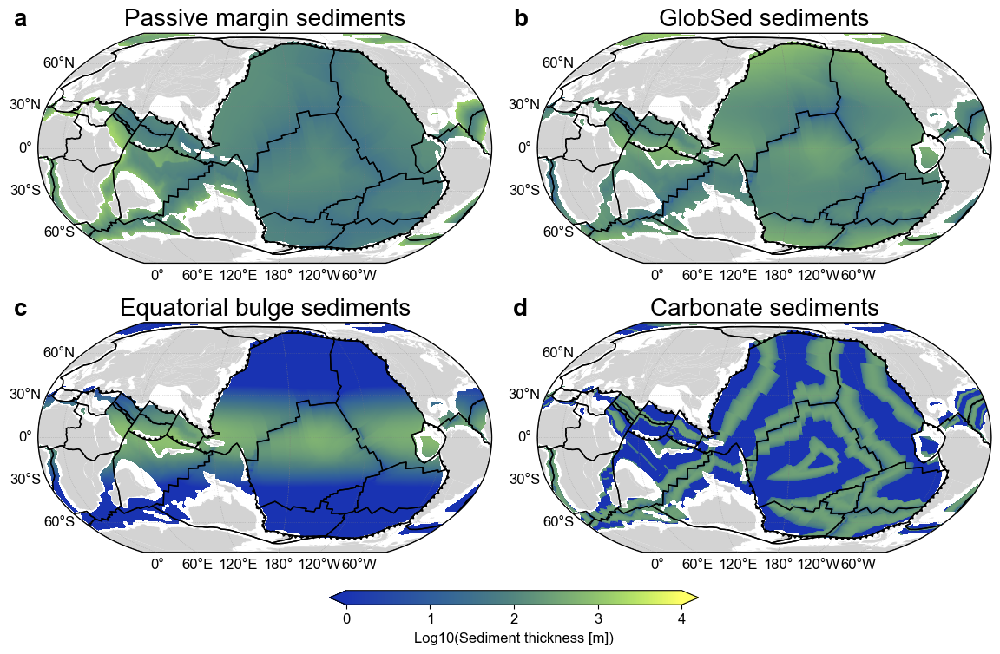

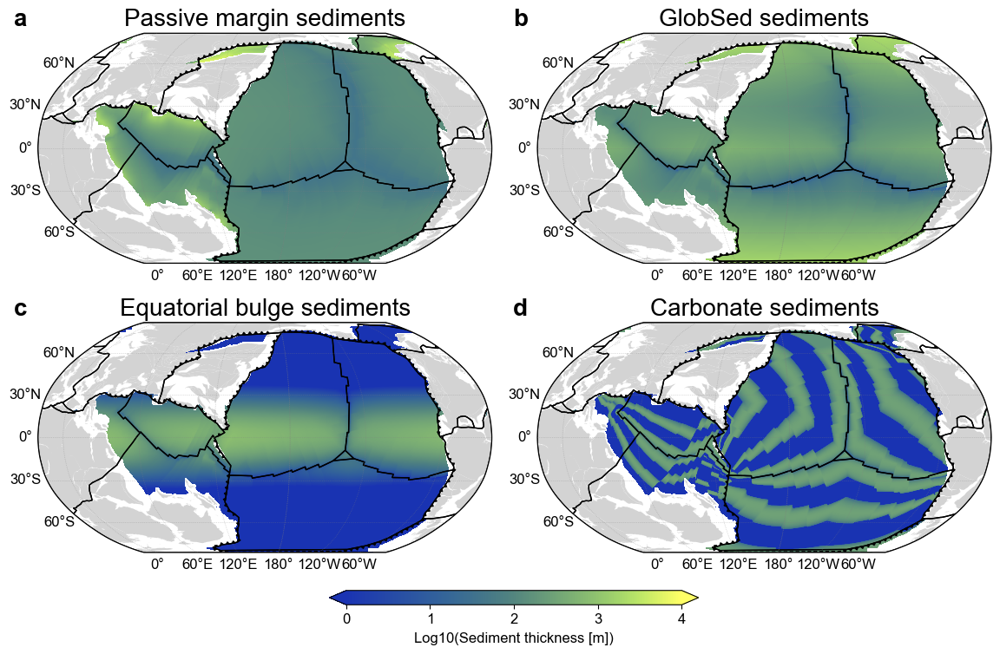

In [29]:
if PLOT_FIGS:
    plot_cases = ["pm_sed", "gs_sed", "eq_sed", "cb_sed"]
    plot_titles = ["Passive margin sediments", "GlobSed sediments", "Equatorial bulge sediments", "Carbonate sediments"]

    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                seds = plot_M2016.plot_sediment_map(ax, plot_time, plot_cases[k])
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate(annotations[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(seds[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Sediment thickness [m])", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Seafloor_sediment_distributions_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

#### 1.4.3. Synthetic velocities

The below cell visualises the synthetic velocities calculated from the torque balance in PLATEFO, as well as the difference with the reconstructed velocities from the [Müller et al. (2016)](https://doi.org/10.1146/annurev-earth-060115-012211) reconstruction.

#### 1.4.1. Example seafloor sediment distributions

Plots of:
- Sediment thickness
- Synthetic plate velocities
- Absolute plate velocity difference
- Relative plate velocity difference

With the differences relative to a case with no sediments.

For the following sediment distributions:
- Passive margin sediments (Dutkiewicz et al., 2017)
- Seafloor sediments (Straume et al., 2019)
- Equatorial bulge sediments
- Carbonate sediments

With the default shear zone width of 2 km.

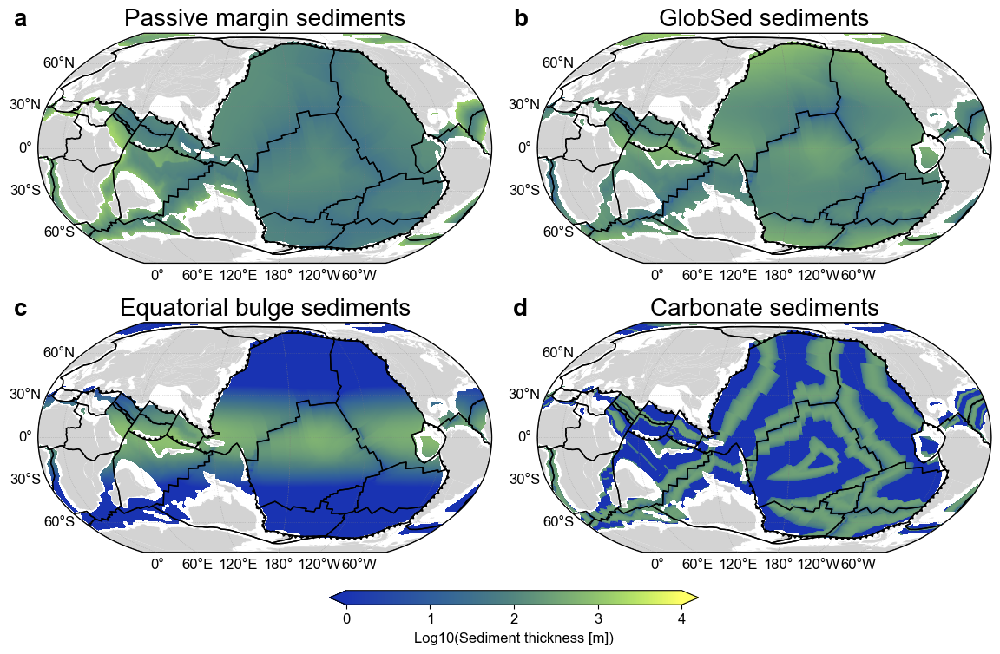

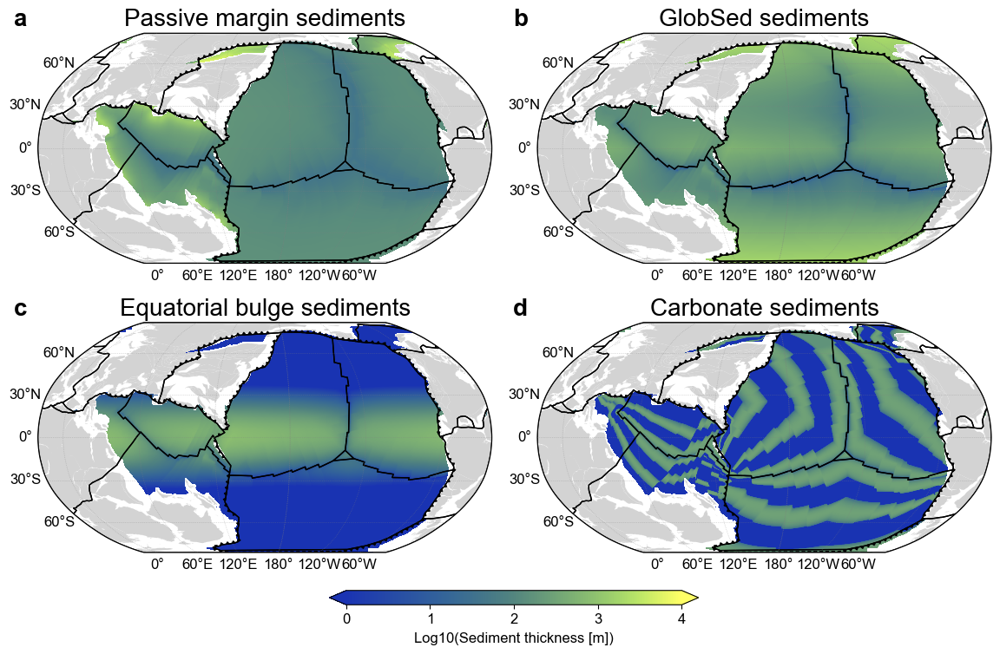

In [30]:
if PLOT_FIGS:    
    plot_cases = ["pm_sed", "gs_sed", "eq_sed", "cb_sed"]
    plot_titles = ["Passive margin sediments", "GlobSed sediments", "Equatorial bulge sediments", "Carbonate sediments"]

    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                sedds = plot_M2016.plot_sediment_map(ax, plot_time, plot_cases[k])
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(seds[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Sediment thickness [m])", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Seafloor_sediments_synthetic_velocities_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 617.99it/s]


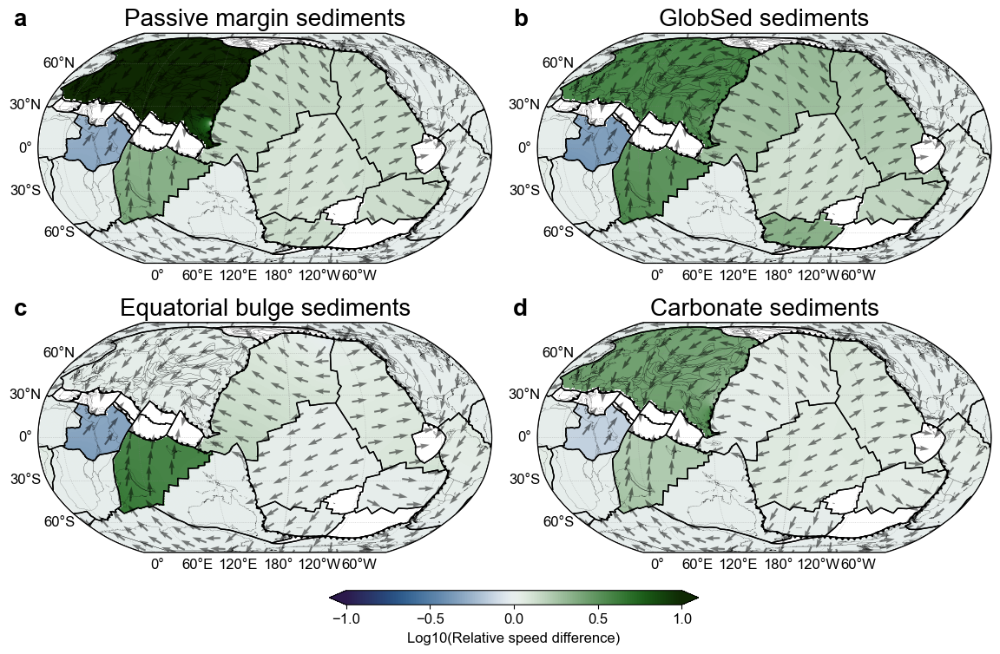

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 571.12it/s]


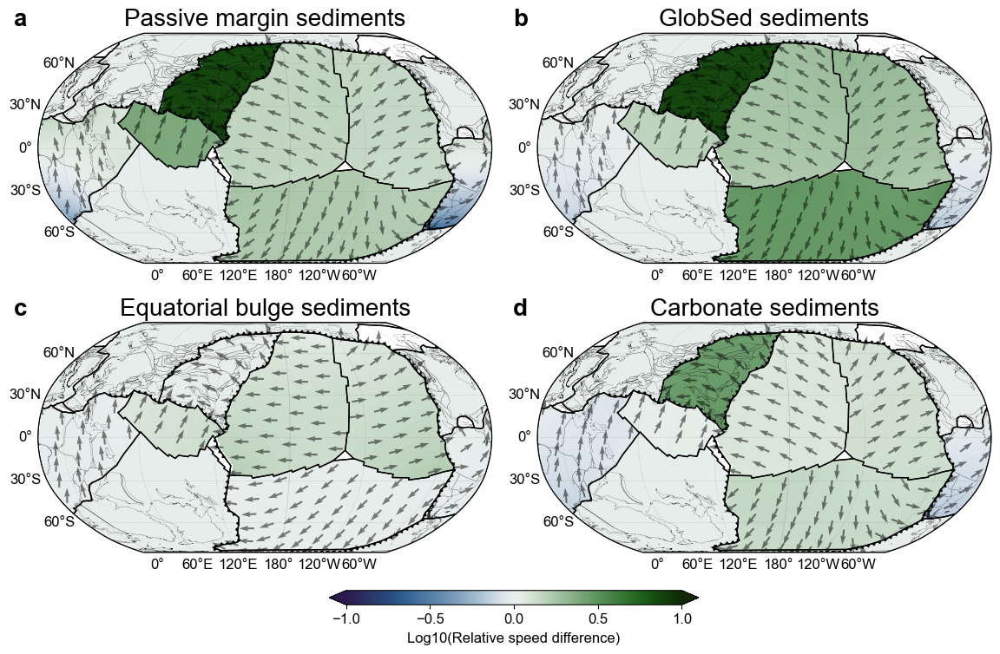

In [31]:
if PLOT_FIGS:    
    plot_cases = ["pm_sed", "gs_sed", "eq_sed", "cb_sed"]
    plot_titles = ["Passive margin sediments", "GlobSed sediments", "Equatorial bulge sediments", "Carbonate sediments"]
    
    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)  # Adjust the width ratio for the colorbar

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                velocities = plot_M2016.plot_relative_velocity_difference_map(ax, plot_time, plot_cases[k], "no_sed")
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(velocities[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Relative speed difference)", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Seafloor_sediment_relative_velocity_differences_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

#### 1.4.2. Active margin sediment distributions

Plots of:
- Sediment thickness
- Synthetic plate velocities
- Absolute plate velocity difference
- Relative plate velocity difference

With the differences relative to a case with no sediments.

For sediment distributions along active continental margins with:
- A constant value
- An age dependence (see Notebook 1)
- A velocity dependence (see Notebook 1)
- The mean of the age and velocity dependence

With the default shear zone width of 2 km.

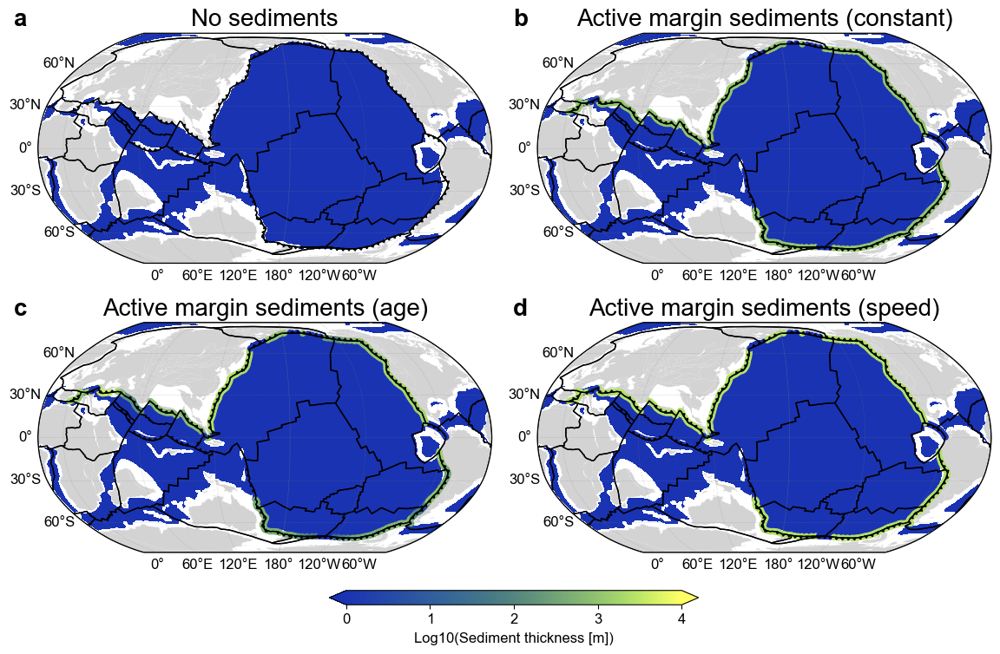

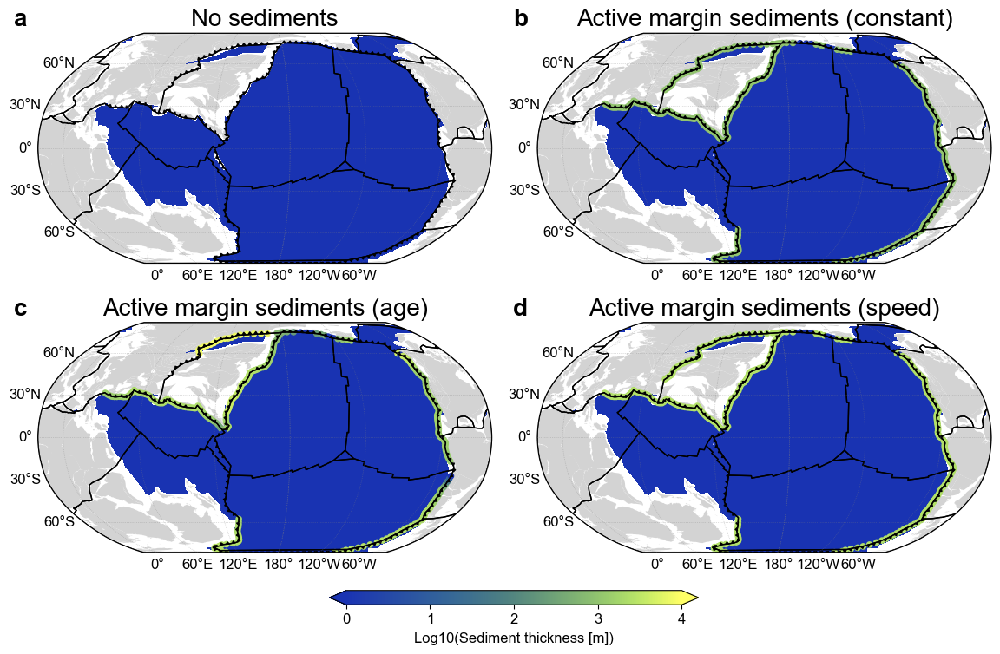

In [32]:
if PLOT_FIGS:    
    plot_cases = ["no_sed", "am_sed", "am_sed_a", "am_sed_v"]
    plot_titles = ["No sediments", "Active margin sediments (constant)", "Active margin sediments (age)", "Active margin sediments (speed)"]
    for plot_time in M2016.ages:
        if plot_time == 100:
            subduction_zone = "Indian"
        elif plot_time == 180:
            subduction_zone = "Eurasian"

        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                seds = plot_M2016.plot_sediment_map(ax, plot_time, plot_cases[k])
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(seds[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Sediment thickness [m])", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Active_margin_sediment_distributions_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 585.80it/s]


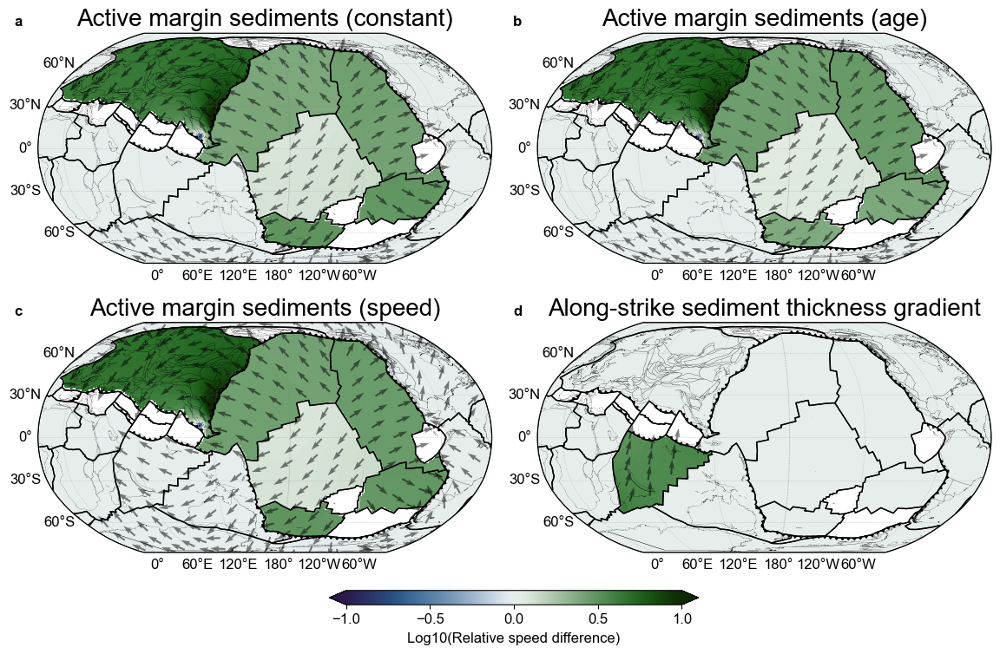

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 610.88it/s]


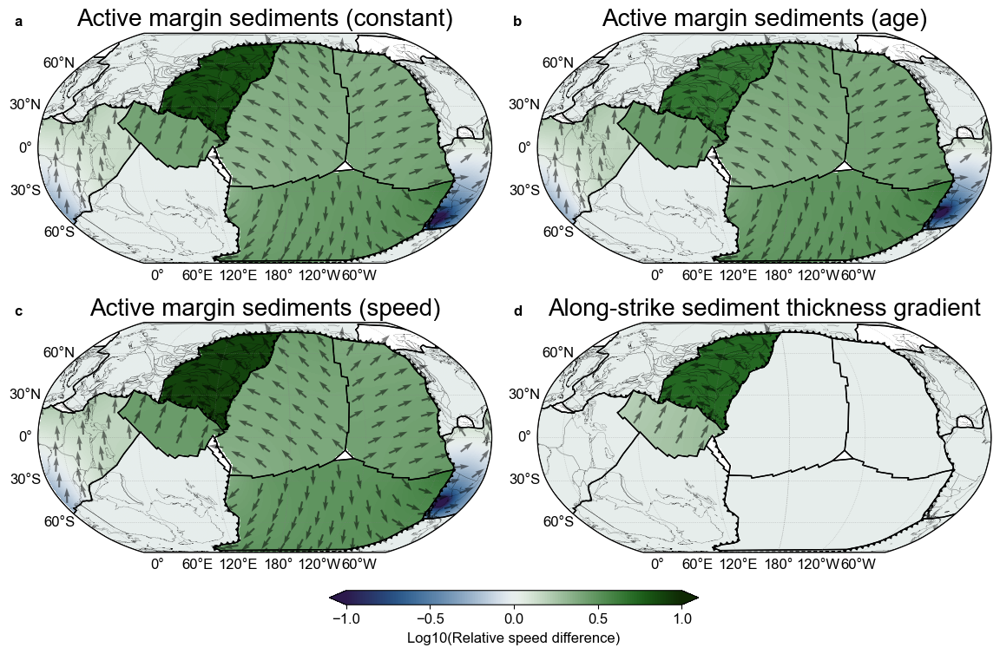

In [33]:
if PLOT_FIGS:
    plot_cases = ["am_sed", "am_sed_a", "am_sed_v", "am_sed_z"]
    plot_titles = ["Active margin sediments (constant)", "Active margin sediments (age)", "Active margin sediments (speed)", "Along-strike sediment thickness gradient"]
    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                velocities = plot_M2016.plot_relative_velocity_difference_map(ax, plot_time, plot_cases[k], "no_sed")
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=12, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(velocities[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Relative speed difference)", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Active_margin_relative_velocity_differences_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

#### 1.4.3. Shear zone width

Plots of:
- Absolute velocity difference
- Relative velocity difference

For carbonate sediments with shear zone widths of:
- 2 km
- 1 km
- 500 m
- 100 m

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 618.90it/s]


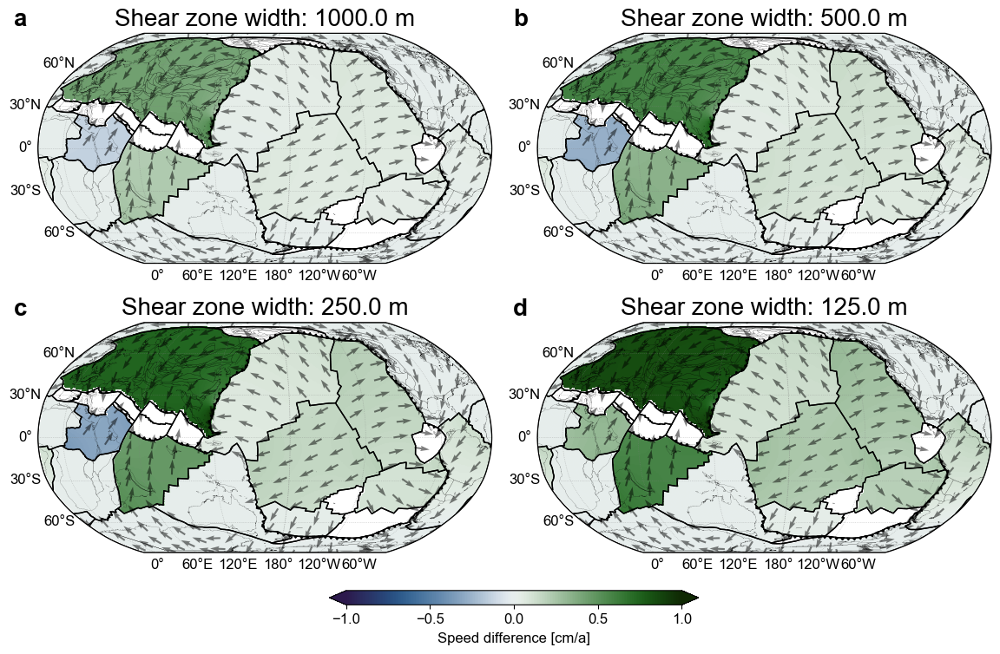

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 619.63it/s]


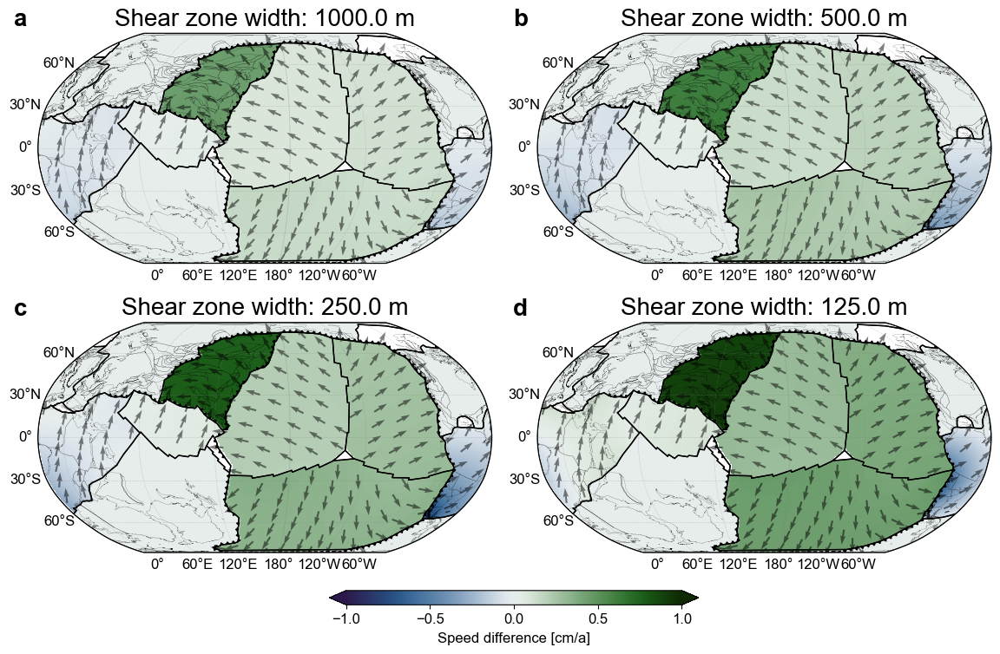

In [34]:
if PLOT_FIGS:
    plot_cases = ["cb_sed", "cb_sed_w1", "cb_sed_w2", "cb_sed_w3"]
    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                velocities = plot_M2016.plot_relative_velocity_difference_map(ax, plot_time, plot_cases[k], "no_sed")
                ax.set_title(f"Shear zone width: {1000/(2**k)} m", fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1
                
        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(velocities[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Speed difference [cm/a]", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Shear_zone_width_relative_velocity_differences_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

#### 1.4.3. Carbonate sediment perturbation

Plots of:
- Sediment thickness
- Absolute velocity difference
- Relative velocity difference

For carbonate sediments with perturbations in thickness distribution from:
- Increased sediment production (i.e. increased thickness)
- Phase shifts in sediment production

With the default shear zone width of 2 km.

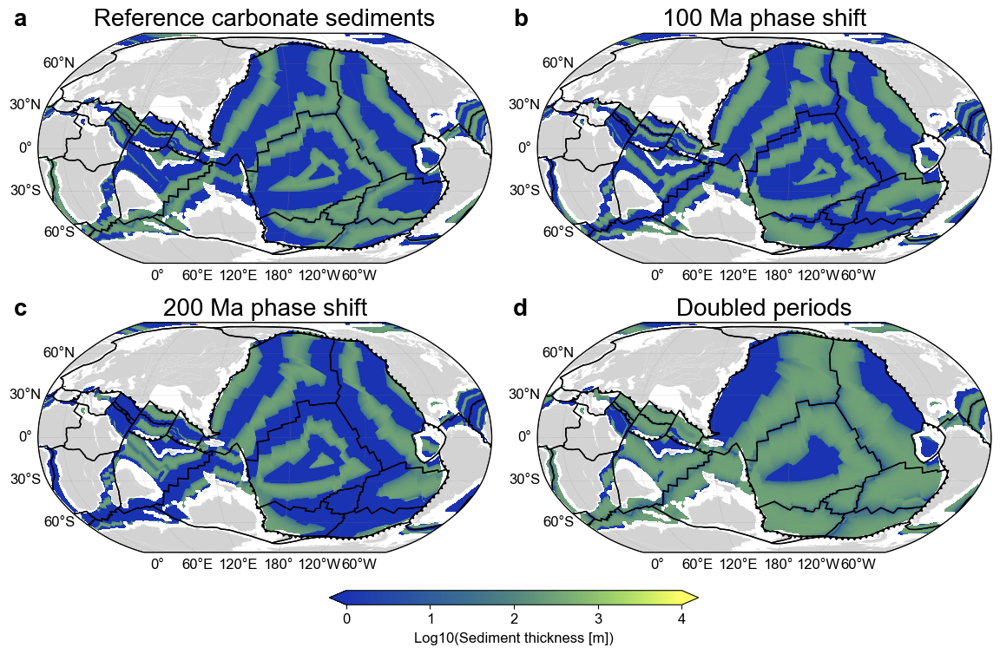

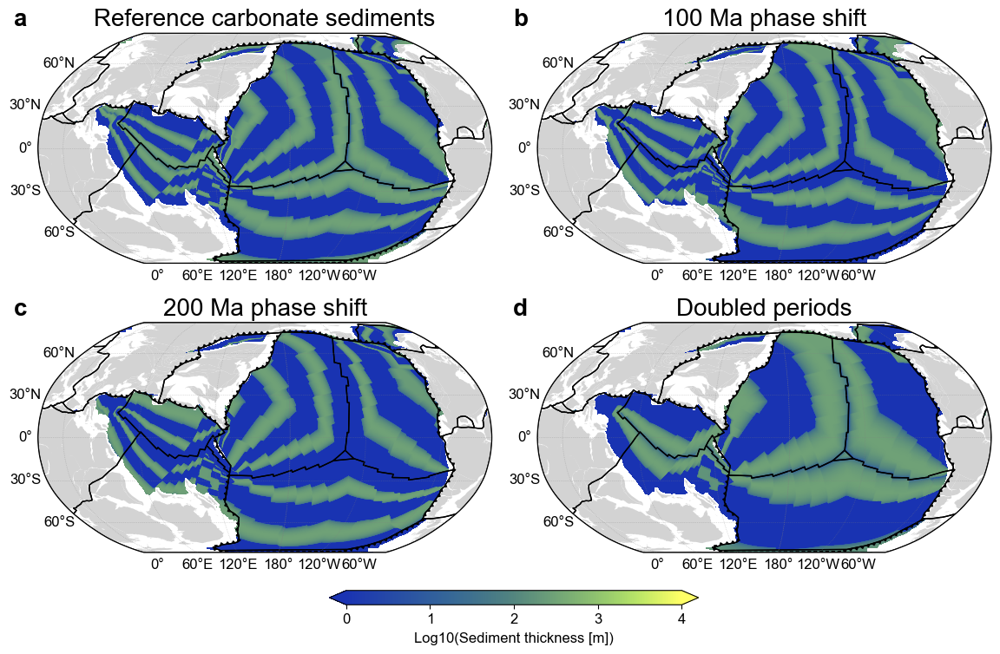

In [35]:
if PLOT_FIGS:    
    plot_cases = ["cb_sed", "cb_sed_o1", "cb_sed_o2", "cb_sed_p"]
    plot_titles = ["Reference carbonate sediments", "100 Ma phase shift", "200 Ma phase shift", "Doubled periods"]
    
    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)  # Adjust the width ratio for the colorbar

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                seds = plot_M2016.plot_sediment_map(ax, plot_time, plot_cases[k])
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(seds[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Sediment thickness [m])", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Carbonate_sediments_distributions_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 539.04it/s]


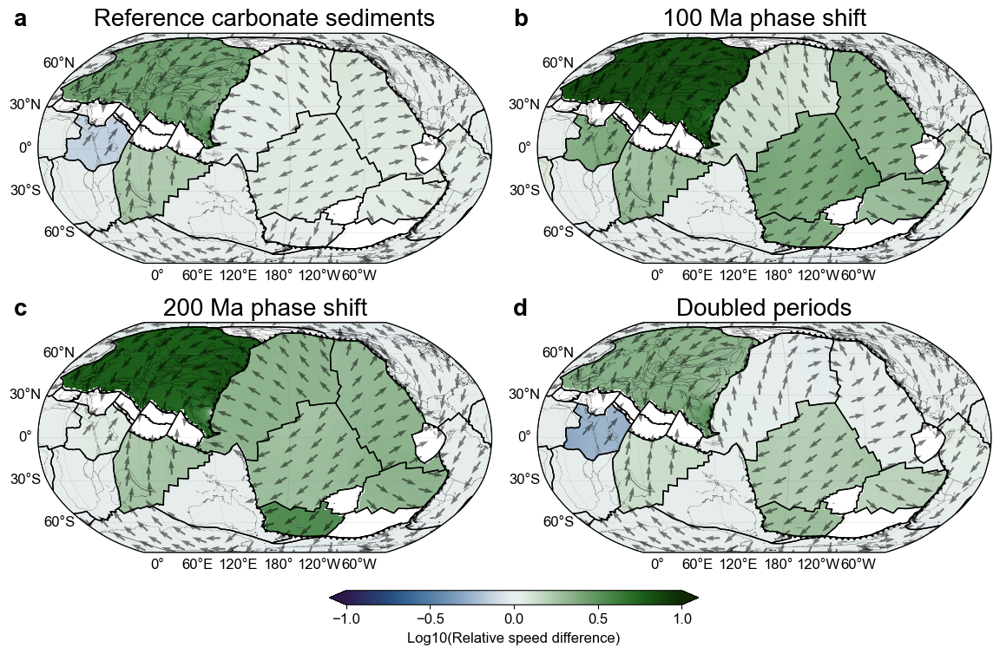

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 616.27it/s]


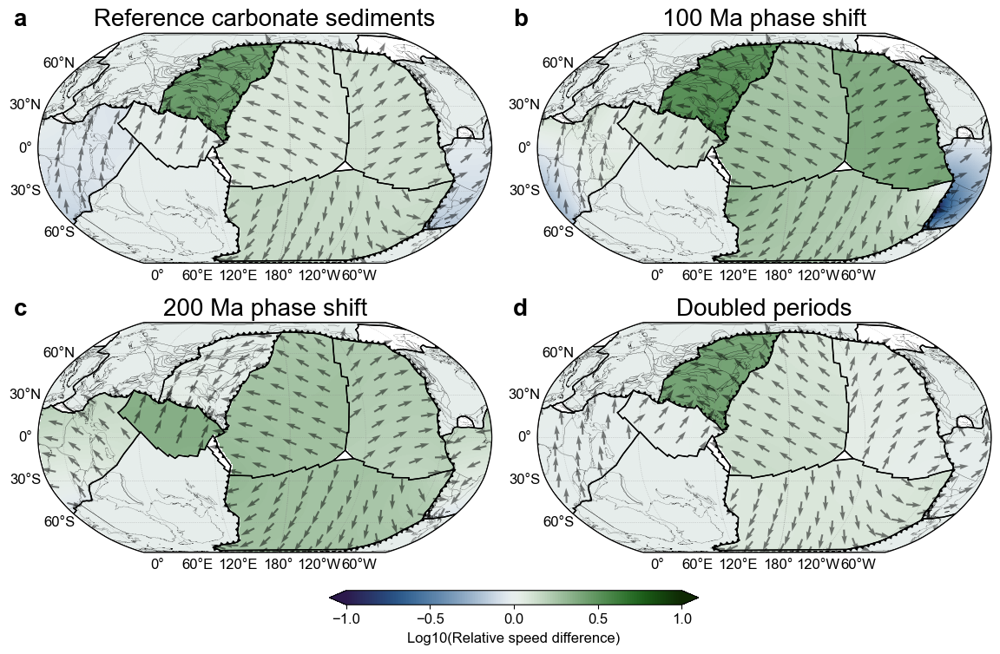

In [36]:
if PLOT_FIGS:    
    plot_cases = ["cb_sed", "cb_sed_o1", "cb_sed_o2", "cb_sed_p"]
    plot_titles = ["Reference carbonate sediments", "100 Ma phase shift", "200 Ma phase shift", "Doubled periods"]
    
    for plot_time in M2016.ages:
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)  # Adjust the width ratio for the colorbar

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                velocities = plot_M2016.plot_relative_velocity_difference_map(ax, plot_time, plot_cases[k], "no_sed")
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(velocities[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Relative speed difference)", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Carbonate_sediments_relative_velocity_differences_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

#### 1.4.4. Along-strike variation in sediment thickness

Plots of:
- Sediment thickness
- Absolute velocities

For different along-strike constrast in sediment thickness along the northern margin of the Indian plate with the default shear zone width of 2 km.

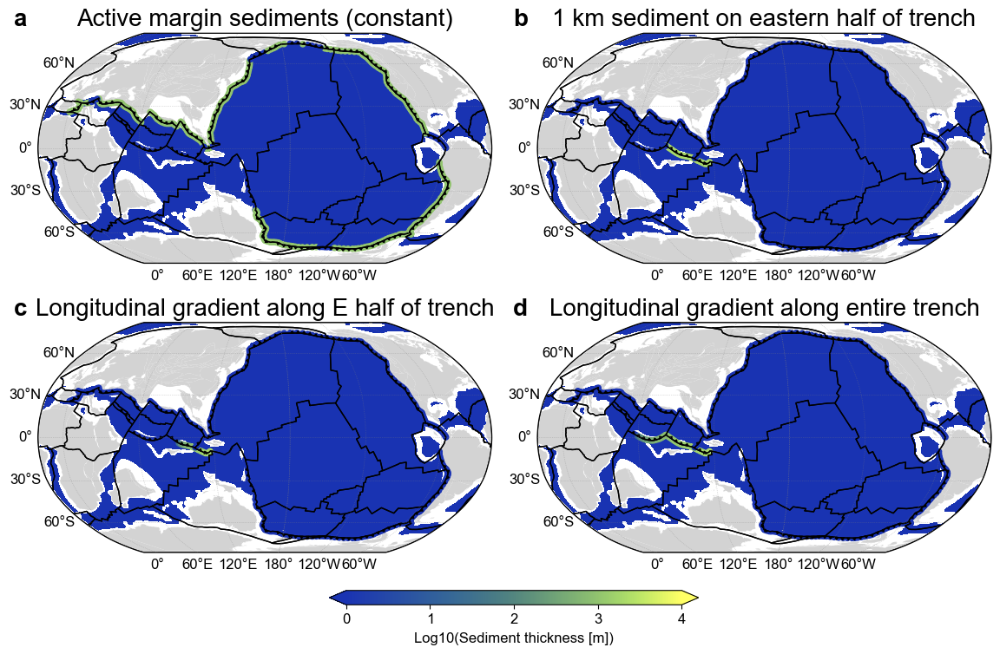

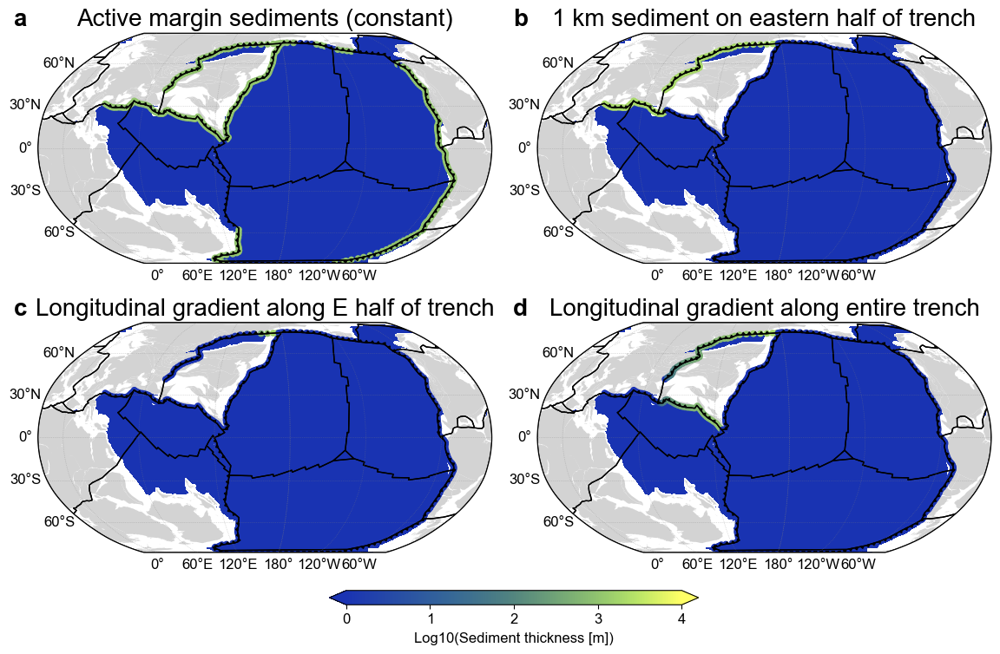

In [37]:
if PLOT_FIGS:    
    plot_cases = ["am_sed", "am_sed_x", "am_sed_y", "am_sed_z"]
    
    for plot_time in M2016.ages:
        plot_titles = [
            "Active margin sediments (constant)", 
            "1 km sediment on eastern half of trench", 
            "Longitudinal gradient along E half of trench",
            "Longitudinal gradient along entire trench"
        ]

        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)  # Adjust the width ratio for the colorbar

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                seds = plot_M2016.plot_sediment_map(ax, plot_time, plot_cases[k])
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(seds[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Sediment thickness [m])", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Single_subduction_zone_sediment_distribution_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 421.20it/s]


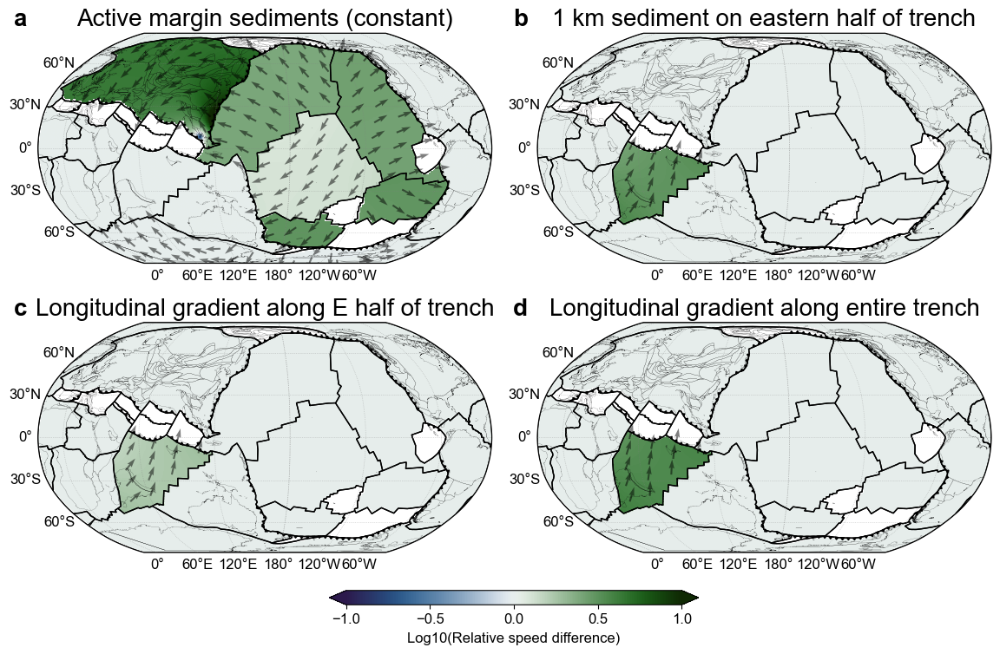

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 563.67it/s]


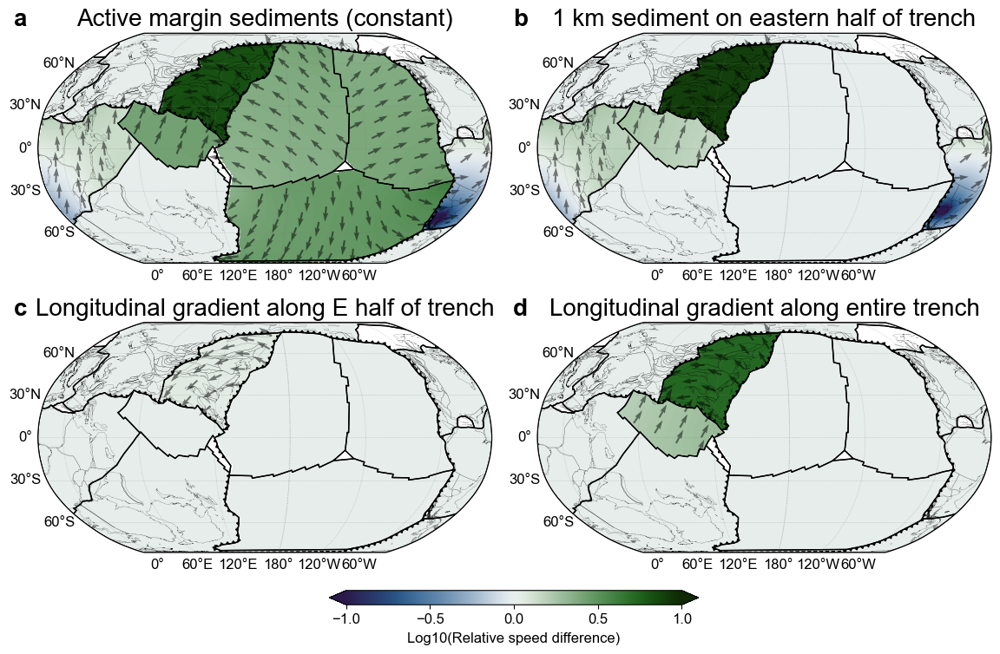

In [38]:
if PLOT_FIGS:    
    plot_cases = ["am_sed", "am_sed_x", "am_sed_y", "am_sed_z"]
    
    for plot_time in M2016.ages:
        plot_titles = [
            "Active margin sediments (constant)", 
            "1 km sediment on eastern half of trench", 
            "Longitudinal gradient along E half of trench",
            "Longitudinal gradient along entire trench"
        ]
        
        # Create a figure and gridspec
        fig = plt.figure(figsize=(fig_width, fig_height_maps))
        gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)  # Adjust the width ratio for the colorbar

        k = 0
        for i in range(2):
            for j in range(2):
                ax = plt.subplot(gs[i, j], projection=projection)
                velocities = plot_M2016.plot_relative_velocity_difference_map(ax, plot_time, plot_cases[k], "no_sed")
                ax.set_title(plot_titles[k], fontsize=title_fontsize)
                ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
                k += 1

        # Create a new grid for the colorbar
        cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

        # Create a colorbar below the subplots
        cbar = plt.colorbar(velocities[0], cax=cax, orientation="horizontal", extend="both", extendfrac=5e-2)

        # Set colorbar label
        cbar.set_label("Log10(Relative speed difference)", labelpad=5)

        # Save the figure
        fig.savefig(os.path.join(figs_dir, f"Single_subduction_zone_relative_velocity_differences_{plot_time}Ma.png"), bbox_inches="tight", dpi=300)

        # Show
        plt.show()

Generating velocity grids: 100%|██████████| 1/1 [00:00<00:00, 610.17it/s]


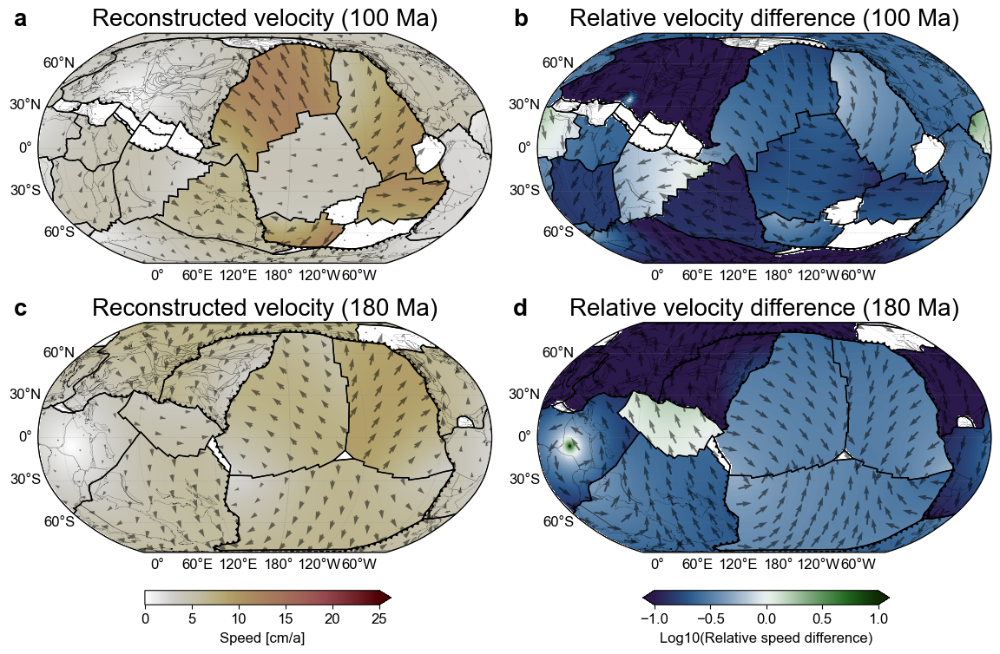

In [40]:
if PLOT_FIGS:        
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps))
    gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1], wspace=0.1, hspace=0.1)  # Adjust the width ratio for the colorbar

    k = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            if j == 0:
                ax.set_title(f"Reconstructed velocity ({M2016.ages[i]} Ma)", fontsize=title_fontsize)
                vels = plot_M2016.plot_velocity_map(ax, M2016.ages[i], "ref")
            else:
                ax.set_title(f"Relative velocity difference ({M2016.ages[i]} Ma)", fontsize=title_fontsize)
                vel_diffs = plot_M2016.plot_relative_velocity_difference_map(ax, M2016.ages[i], "no_sed", "ref")
            ax.annotate("abcd"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontsize=title_fontsize, fontweight="bold")
            k += 1

    # Create new grids for the colourbars
    cax1 = fig.add_axes([0.212, 0.06, 0.2, 0.02])
    cax2 = fig.add_axes([0.617, 0.06, 0.2, 0.02])

    # Create a colorbar below the subplots
    cbar1 = plt.colorbar(vels[0], cax=cax1, orientation="horizontal", extend="max", extendfrac=5e-2)
    cbar2 = plt.colorbar(vel_diffs[0], cax=cax2, orientation="horizontal", extend="both", extendfrac=5e-2)

    # Set colorbar label
    cbar1.set_label("Speed [cm/a]", labelpad=5)
    cbar2.set_label("Log10(Relative speed difference)", labelpad=5)

    # Save the figure
    fig.savefig(os.path.join(figs_dir, f"Difference_with_reconstructed_velocities.png"), bbox_inches="tight", dpi=300)

    # Show
    plt.show()